In [1]:
from IPython.display import display, HTML
display(HTML("""
<style>
div.container{width:86% !important;}
div.cell.code_cell.rendered{width:100%;}
div.CodeMirror {font-family:Consolas; font-size:12pt;}
div.output {font-size:12pt; font-weight:bold;}
div.input {font-family:Consolas; font-size:12pt;}
div.prompt {min-width:70px;}
div#toc-wrapper{padding-top:120px;}
div.text_cell_render ul li{font-size:12pt;padding:5px;}
table.dataframe{font-size:12px;}
</style>
"""))

# <span style="color:red"> ch1. 머신러닝 시작하기 </span>
# 1절. 머신러닝 개요
- 인사이트 도출 : 탐색적 자료분석(EDA)  ; Pandas&Numpy, matplotlib&seaborn
- 최적화 : 머신 러닝(sklearn, scipy.stats, statsmodels)과 딥러닝(tensorflow) 모델링

- 머신 러닝 : 학습을 통해 측정된 작업 성능을 향상
    * 지도 학습(감독학습) : 타겟변수 있음
    * 비지도 학습(자율학습) : 타겟변수 없음 K-means, PCA...

# 2절. 데이터 탐색
## 2.1 변수의 종류
- 데이터 속성에 따라 비율식(연속형, 영존재), 구간식(순서, 간격의미), 순서식(서열, 5점척도..), 명목식(남여, 지역)으로 데이터 구분
- 변수의 타입에 따라 연속형, 이산형, 범주형
- 데이터 품질에 따라 특이값(비정상치, 이상치), 결측값

## 2.2 통계요약 : 중심위치 측도(평균, 중위값, 최빈값), 산포측도(왜도, 첨도)

In [2]:
import numpy as np
from scipy.stats import kurtosis, skew

In [3]:
# 중심위치측도가 0, 표준편차가 1인 10000000개 데이터 추출
data = np.random.normal(loc=0, scale=1.0, size=10000000)
data.shape

(10000000,)

In [3]:
# 분포도(히스토그램)
import matplotlib.pyplot as plt
plt.hist(data, bins=300)
plt.show()

NameError: name 'data' is not defined

In [7]:
print('왜도(치우친 정도) :', skew(data))
print('첨도(뾰족한 정도) :', kurtosis(data))

왜도(치우친 정도) : 0.000496684237861869
첨도(뾰족한 정도) : 0.0030686552157019875


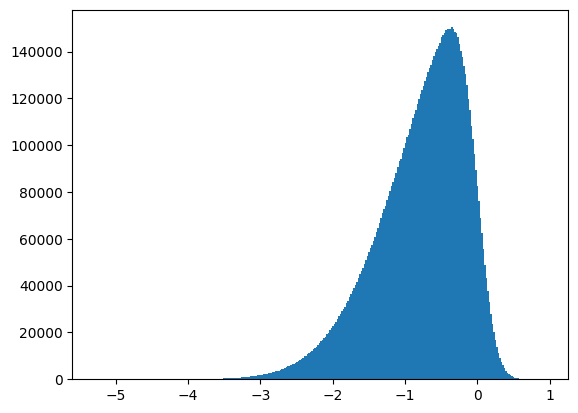

왼쪽으로 긴꼬리 분포(오른쪽으로 치우친) - skew(음수):  -0.8505024004070645


In [14]:
from scipy.stats import skewnorm, norm
# 왜도가 -5인 비대칭 난수 생성(loc 중심척도, scale=분포폭)
# data1 = skewnorm(a= -5, loc=0, scale=1).rvs(size=10000000)
data1 = skewnorm.rvs(a= -5, loc=0, scale=1, size=10000000)
# 대칭 난수 생성
# data2 = norm.rvs(loc=0, scale=1.0, size=10000000)
# data2 = np.random.normal(loc=0, scale=1.0, size=10000000)

plt.hist(data1, bins=300)
plt.show()
sk = skew(data1)
if -0.1 < sk < 0.1:
    print('정규분포: ', sk)
elif sk <=- 0.1:
    print('왼쪽으로 긴꼬리 분포(오른쪽으로 치우친) - skew(음수): ', sk)
else:
    print('오른쪽으로 긴꼬리 분포(왼쪽으로 치우친) - skew(양수): ', sk)

In [17]:
print('평균 :', np.mean(data))
print('중앙값 :', np.median(data))
print('분산 :', np.var(data))
print('표준편차 :', np.std(data))

평균 : -0.0001660223929440118
중앙값 : -0.00030042851124814765
분산 : 0.999384226938931
표준편차 : 0.9996920660578091


## 2.3 기초통계량
- describe() 함수
    * 수치형 : 최소, 최대값, 사분위수, 평균, 표준편차
    * 범주형 : unique갯수, 최빈데이터, 최빈데이터빈도

In [4]:
from seaborn import load_dataset
iris = load_dataset('iris')
iris.describe(include='all')  # include='all' : 수치형&범주형

,sepal_length,sepal_width,petal_length,petal_width,species
count,150.000000,150.000000,150.000000,150.000000,150
unique,NaN,NaN,NaN,NaN,3
top,NaN,NaN,NaN,NaN,setosa
freq,NaN,NaN,NaN,NaN,50
mean,5.843333,3.057333,3.758000,1.199333,NaN
std,0.828066,0.435866,1.765298,0.762238,NaN
min,4.300000,2.000000,1.000000,0.100000,NaN
25%,5.100000,2.800000,1.600000,0.300000,NaN
50%,5.800000,3.000000,4.350000,1.300000,NaN
75%,6.400000,3.300000,5.100000,1.800000,NaN


In [24]:
print('범주형 데이터의 데이터 종류수 :', iris['species'].nunique()) 
print('데이터 종류(범주형, 수치형) :', iris['species'].unique()) 

범주형 데이터의 데이터 종류수 : 3
데이터 종류(범주형, 수치형) : ['setosa' 'versicolor' 'virginica']


In [25]:
iris['species'].value_counts()

setosa        50
versicolor    50
virginica     50
Name: species, dtype: int64

In [26]:
iris.shape

(150, 5)

## 2.4 데이터 가속화
```
pip install dataprep : EDA를 쉽게 하는 라이브러리

```
### dataprep.eda 안의 주요 함수
- plot() : 각 변수의 분포 그래프, 파이그래프, 산점도 등 표시
- plot_correlation() : 각 변수들 사이의 상관계수 히트맵
- plot_missing() : 결측값 분포를 쉽게 확인


In [27]:
%pip install dataprep

  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ---------------------------------------- 0.0/6.4 MB ? eta -:--:--
     -------------- ------------------------- 2.4/6.4 MB 12.2 MB/s eta 0:00:01
     ----------------------------- ---------- 4.7/6.4 MB 11.9 MB/s eta 0:00:01
     ---------------------------------------- 6.4/6.4 MB 11.1 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
INFO: pip is looking at multiple versions of flask to determine which version is compatible with other requirements. This could take a while.
INFO: pip is looking at multiple versions of dask[array,dataframe,delayed] to determine which version is compatible with other requirements. This could take a while.
INFO: pip is still looking at multiple versions of dask[array,dataframe,delayed] to determine which version is compatible with other requirements. This could take a while.
INFO: Th

  DEPRECATION: Building 'sqlalchemy' using the legacy setup.py bdist_wheel mechanism, which will be removed in a future version. pip 25.3 will enforce this behaviour change. A possible replacement is to use the standardized build interface by setting the `--use-pep517` option, (possibly combined with `--no-build-isolation`), or adding a `pyproject.toml` file to the source tree of 'sqlalchemy'. Discussion can be found at https://github.com/pypa/pip/issues/6334
  DEPRECATION: Building 'metaphone' using the legacy setup.py bdist_wheel mechanism, which will be removed in a future version. pip 25.3 will enforce this behaviour change. A possible replacement is to use the standardized build interface by setting the `--use-pep517` option, (possibly combined with `--no-build-isolation`), or adding a `pyproject.toml` file to the source tree of 'metaphone'. Discussion can be found at https://github.com/pypa/pip/issues/6334
  Consider adding this directory to PATH or, if you prefer to suppress thi

  0%|                                                                                          | 0/259 [00:00<…


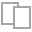
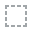
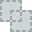
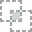
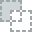
...
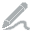
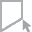
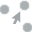
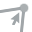
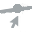

In [9]:
from dataprep.eda import plot, plot_correlation, plot_missing
plot(iris) # show stats and Insights 버튼 클릭시 데이터 통계량과 insight


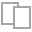
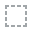
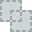
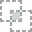
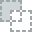
...
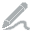
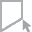
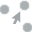
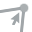
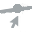

In [7]:
plot_correlation(iris)

  0%|                                                                                          | 0/105 [00:00<…


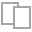
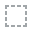
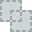
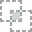
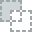
...
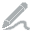
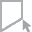
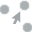
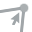
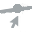

In [10]:
plot_missing(iris)

In [11]:
iris.corr(numeric_only=True, method='pearson')

,sepal_length,sepal_width,petal_length,petal_width
sepal_length,1.000000,-0.117570,0.871754,0.817941
sepal_width,-0.117570,1.000000,-0.428440,-0.366126
petal_length,0.871754,-0.428440,1.000000,0.962865
petal_width,0.817941,-0.366126,0.962865,1.000000


In [13]:
from scipy.stats import pearsonr
corr, p_value = pearsonr(iris.petal_length, iris.petal_width)
print('corr:{:6f}, p_value:{}'.format(corr, p_value))

# 가설  p_value : 0.5 미만이면 유의미하다


corr:0.962865, p_value:4.675003907326542e-86


In [14]:
import pandas as pd
score = pd.DataFrame({'kor':[50,60,70],
                     'mat' :[60,75,80]})
display(score)
display(pd.crosstab(score.kor, score.mat))

,kor,mat
0,50,60
1,60,75
2,70,80


mat,60,75,80
kor,,,
50,1,0,0
60,0,1,0
70,0,0,1


### 스피어만 상관계수
- 두 변수가 순서 척도(ex. 5점 척도)이거나, 두 연속형 데이터의 분포가 심각하게 정규분포를 벗어난 경우

In [15]:
iris.corr(numeric_only=True, method='spearman')

,sepal_length,sepal_width,petal_length,petal_width
sepal_length,1.000000,-0.166778,0.881898,0.834289
sepal_width,-0.166778,1.000000,-0.309635,-0.289032
petal_length,0.881898,-0.309635,1.000000,0.937667
petal_width,0.834289,-0.289032,0.937667,1.000000


In [16]:
from scipy.stats import spearmanr
corr, p_value = spearmanr(iris.petal_length, iris.petal_width)
corr, p_value

(0.9376668235763412, 8.156596854126675e-70)

## 2.6 독립성 검정
- 두 변수 간의 

In [18]:
data = pd.DataFrame({'대서양':[8,2],
                    '인도양':[1,5]},
                    index=['고래', '상어'])

data

,대서양,인도양
고래,8,1
상어,2,5


In [20]:
# 대서양에 고래가 많고, 인도양에 상어가 많은지 검정
from scipy.stats import fisher_exact
oddstratio, pvalue = fisher_exact(data)
oddstratio, pvalue
# oddstratio : 관측된 데이터 간 상대적 강도
# = 1 : 독립적

(20.0, 0.034965034965034975)

### 맥니마 검정
- 치료효과 등 대조군과 비교하기 위해

In [22]:
data = pd.DataFrame({'치료 후 음성': [59, 16, 75],
                    '치료 후 양성' : [6, 80, 86]},
                   index=['치료 전 양성', '치료 전 음성', '계'])
data['계'] = data['치료 후 음성']+data['치료 후 양성']

In [23]:
data

,치료 후 음성,치료 후 양성,계
치료 전 양성,59,6,65
치료 전 음성,16,80,96
계,75,86,161


In [29]:
# 맥니마 검정을 위해 계를 제외, 판다스보단 넘파이 배열이 대체로 더 많이 쓰이므로 변환
table = np.array(data.iloc[:2,:2])
table

array([[59,  6],
       [16, 80]], dtype=int64)

In [30]:
# 치료가 음성과 양성에 영향을 미치는지 검정
from statsmodels.stats.contingency_tables import mcnemar
result = mcnemar(table=table,
                exact=True,      #  True : 이산형이거나 소량형이거나 /  False : 연속형, 대량형
                correction=True)
result.statistic, result.pvalue

(6.0, 0.052478790283203125)

In [59]:
result = mcnemar(table=table,
                exact=False,
                correction=False)
result.statistic, result.pvalue

(4.545454545454546, 0.0330062576612325)

### 다차원 척도법

In [31]:
import seaborn as sns

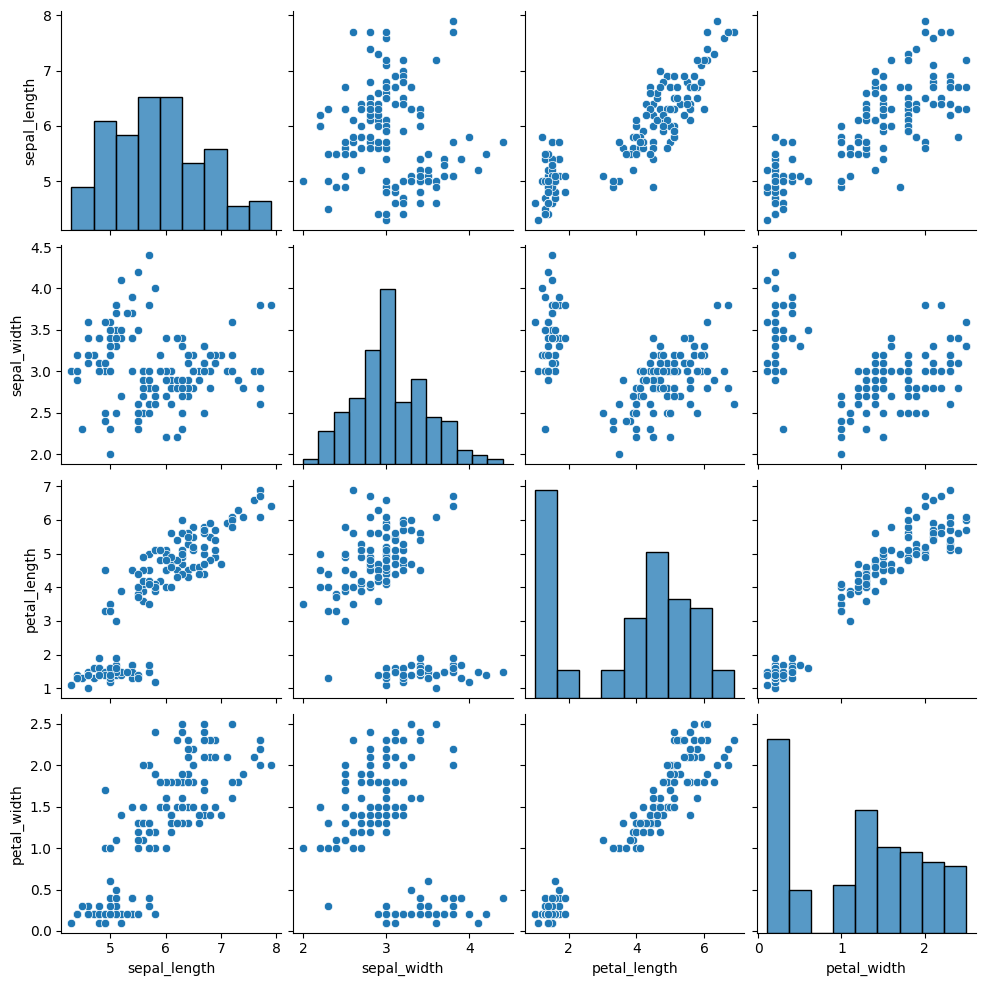

In [61]:
sns.pairplot(iris)
plt.show()

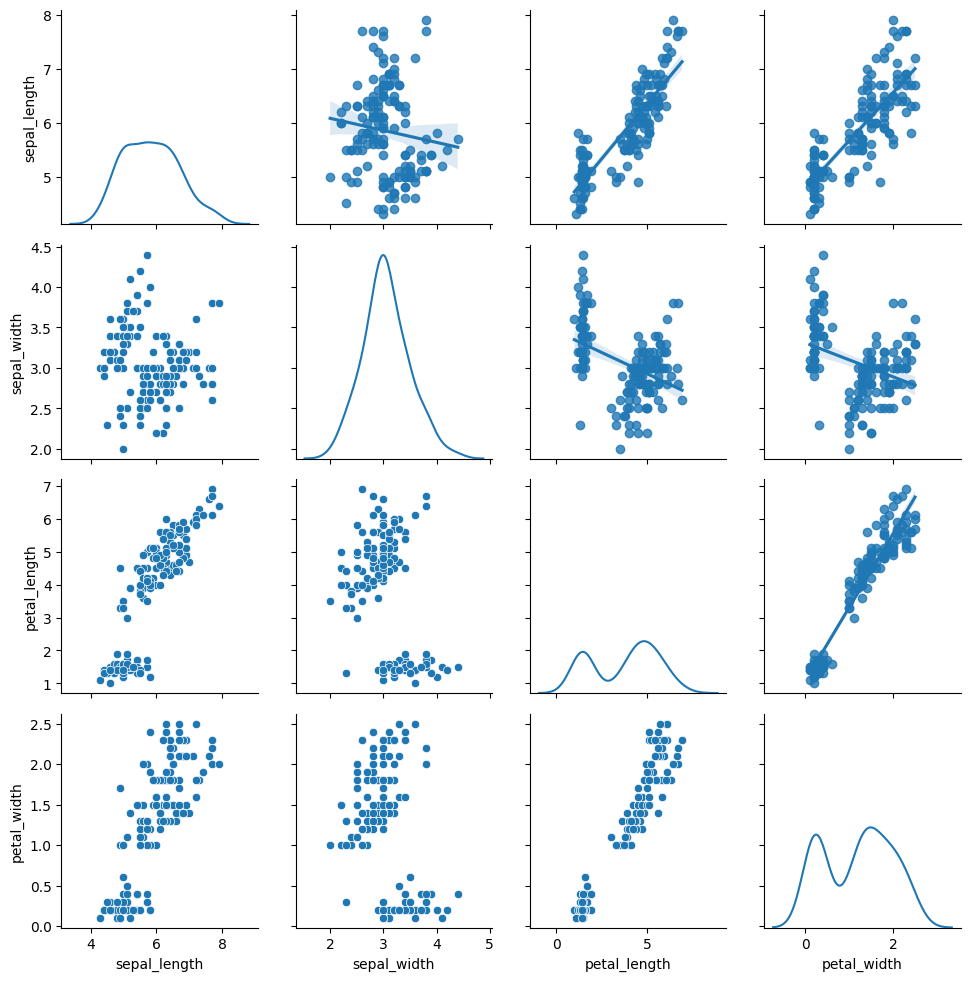

In [34]:
g = sns.PairGrid(iris)
g.map_diag(sns.kdeplot) # map_diag 대각선 영역 그래프
g.map_lower(sns.scatterplot) # map_lower 대각선 아래는 산점도
g.map_upper(sns.regplot) # map_upper 대각선 위는 회귀선을 포함한 산점도

# 3절. 데이터 전처리
- 데이터 스케일 조정, 인코딩, 결측치 처리
## 3.1 데이터 스케일 조정 
- 학습효과를 높이기 위함. 
- fit(data)
- transform(data)
- fit_transform(data)
- inverse_transform(data) - normalizer는 없음

In [36]:
pd.DataFrame({'정규화':['스케일링 시 최대, 최소값이 사용',
                             '피쳐의 크기가 다를 때 사용',
                          '(0,1) 또는 (-1,1)사이의 값으로 스케일링',
                          '분포에 대해 모를 때 유용',
                          'MinMaxScaler, Normalizer'],
                   '표준화':['스케일링 시 평균과 표준편차가 사용된다.',
                         '평균이 0, 표준편차가 1로 스케일링',
                         '특정 범위로 제한되지 않는다',
                         '피처가 정규분포인 경우 유용',
                         'StandardScaler, RobustScaler']})

,정규화,표준화
0,"스케일링 시 최대, 최소값이 사용",스케일링 시 평균과 표준편차가 사용된다.
1,피쳐의 크기가 다를 때 사용,"평균이 0, 표준편차가 1로 스케일링"
2,"(0,1) 또는 (-1,1)사이의 값으로 스케일링",특정 범위로 제한되지 않는다
3,분포에 대해 모를 때 유용,피처가 정규분포인 경우 유용
4,"MinMaxScaler, Normalizer","StandardScaler, RobustScaler"


In [37]:
pd.DataFrame({'Scaler 종류':['StandardScaler','MinMaxScaler', 'RobustScaler','Normalizer'],
             '적용 방식':['Z-score 정규화',
                      '최소-최대 정규화',
                      '중앙값 기준 스케일링',
                      '벡터 정규화 (L2, L1)'],
             '수식':['X−μ / σ', 'X−Xmin / (Xmax−Xmin)','X-Q1/ (Q3-Q1)','x/||X||'],
             '특징':['평균0, 표준편차1로 변환',
                  '0~1 범위로 변환',
                  '이상치 영향을 덜 받음',
                  '각 샘플의 크기를 1로 맞춤(행 단위로 정규화)'],
             '이상치 영향':['민감','많이민감','적음','없음'],
             '상황':['정규분포가정모델(회귀, PCA, SVM)',
                    '이상치가 많은 경우',
                    '값을 0~1로 조정해야 하는 경우 안정적으로 변환',
                    '거리기반 모델, KNN, Cosine Similarity, NLP']})

,Scaler 종류,적용 방식,수식,특징,이상치 영향,상황
0,StandardScaler,Z-score 정규화,X−μ / σ,"평균0, 표준편차1로 변환",민감,"정규분포가정모델(회귀, PCA, SVM)"
1,MinMaxScaler,최소-최대 정규화,X−Xmin / (Xmax−Xmin),0~1 범위로 변환,많이민감,이상치가 많은 경우
2,RobustScaler,중앙값 기준 스케일링,X-Q1/ (Q3-Q1),이상치 영향을 덜 받음,적음,값을 0~1로 조정해야 하는 경우 안정적으로 변환
3,Normalizer,"벡터 정규화 (L2, L1)",x/||X||,각 샘플의 크기를 1로 맞춤(행 단위로 정규화),없음,"거리기반 모델, KNN, Cosine Similarity, NLP"


In [38]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, Normalizer

In [63]:
df = pd.DataFrame({
    'x1': np.arange(1,11),
    'x2' : np.arange(1,11)**2 })
#df

In [62]:
# StandardScaler : 평균 0,표준편차 1로 표준화
scaler = StandardScaler() # 
scaler.fit(df)
df_std = scaler.transform(df)
df_std = pd.DataFrame(df_std, columns=['x1_std', 'x2_std'])
result = pd.concat( [df, df_std], axis=1 )
#scaler.inverse_transform(df_std) # 원래 데이터 스타일로
result

,x1,x2,x1_std,x2_std
0,1,1,-1.566699,-1.156697
1,2,4,-1.218544,-1.064161
2,3,9,-0.870388,-0.909935
3,4,16,-0.522233,-0.694018
4,5,25,-0.174078,-0.416411
5,6,36,0.174078,-0.077113
6,7,49,0.522233,0.323875
7,8,64,0.870388,0.786554
8,9,81,1.218544,1.310923
9,10,100,1.566699,1.896983


In [64]:
# MinMaxScaler : 정규화 0~1
scaler = MinMaxScaler()  
df_min = scaler.fit_transform(df)
df_min = pd.DataFrame(df_min, columns=['x1_min', 'x2_min'])
result = pd.concat([result, df_min], axis=1)
result

,x1,x2,x1_std,x2_std,x1_min,x2_min
0,1,1,-1.566699,-1.156697,0.000000,0.000000
1,2,4,-1.218544,-1.064161,0.111111,0.030303
2,3,9,-0.870388,-0.909935,0.222222,0.080808
3,4,16,-0.522233,-0.694018,0.333333,0.151515
4,5,25,-0.174078,-0.416411,0.444444,0.242424
5,6,36,0.174078,-0.077113,0.555556,0.353535
6,7,49,0.522233,0.323875,0.666667,0.484848
7,8,64,0.870388,0.786554,0.777778,0.636364
8,9,81,1.218544,1.310923,0.888889,0.808081
9,10,100,1.566699,1.896983,1.000000,1.000000


In [66]:
# RobustScaler : 중앙값 0, 사분위수 IQR을 기준으로 정규화, 극단적인 값에 영향을 덜 받게 되는 특징
scaler = RobustScaler()
df_rob = scaler.fit_transform(df)
df_rob = pd.DataFrame(df_rob, columns=['x1_rob', 'x2_rob'])
result = pd.concat([result, df_rob], axis=1)
result

,x1,x2,x1_std,x2_std,x1_min,x2_min,x1_rob,x2_rob
0,1,1,-1.566699,-1.156697,0.000000,0.000000,-1.000000,-0.595960
1,2,4,-1.218544,-1.064161,0.111111,0.030303,-0.777778,-0.535354
2,3,9,-0.870388,-0.909935,0.222222,0.080808,-0.555556,-0.434343
3,4,16,-0.522233,-0.694018,0.333333,0.151515,-0.333333,-0.292929
4,5,25,-0.174078,-0.416411,0.444444,0.242424,-0.111111,-0.111111
5,6,36,0.174078,-0.077113,0.555556,0.353535,0.111111,0.111111
6,7,49,0.522233,0.323875,0.666667,0.484848,0.333333,0.373737
7,8,64,0.870388,0.786554,0.777778,0.636364,0.555556,0.676768
8,9,81,1.218544,1.310923,0.888889,0.808081,0.777778,1.020202
9,10,100,1.566699,1.896983,1.000000,1.000000,1.000000,1.404040


In [67]:
# Normalizer : 타겟변수가 없는 경우
scaler = Normalizer()
df_nor = scaler.fit_transform(df)
df_nor = pd.DataFrame(df_nor, columns=['x1_nor', 'x2_nor'])
result = pd.concat([result, df_nor], axis=1)
result

,x1,x2,x1_std,x2_std,x1_min,x2_min,x1_rob,x2_rob,x1_nor,x2_nor
0,1,1,-1.566699,-1.156697,0.000000,0.000000,-1.000000,-0.595960,0.707107,0.707107
1,2,4,-1.218544,-1.064161,0.111111,0.030303,-0.777778,-0.535354,0.447214,0.894427
2,3,9,-0.870388,-0.909935,0.222222,0.080808,-0.555556,-0.434343,0.316228,0.948683
3,4,16,-0.522233,-0.694018,0.333333,0.151515,-0.333333,-0.292929,0.242536,0.970143
4,5,25,-0.174078,-0.416411,0.444444,0.242424,-0.111111,-0.111111,0.196116,0.980581
5,6,36,0.174078,-0.077113,0.555556,0.353535,0.111111,0.111111,0.164399,0.986394
6,7,49,0.522233,0.323875,0.666667,0.484848,0.333333,0.373737,0.141421,0.989949
7,8,64,0.870388,0.786554,0.777778,0.636364,0.555556,0.676768,0.124035,0.992278
8,9,81,1.218544,1.310923,0.888889,0.808081,0.777778,1.020202,0.110432,0.993884
9,10,100,1.566699,1.896983,1.000000,1.000000,1.000000,1.404040,0.099504,0.995037


#### 데이터 전처리 과정이 평균 60%~70% 정도
- 데이터 수집 -> 데이터전처리 -> (비지도학습) -> 모델 구축(DL/ML) -> 성능평가 -> 배포&유지보수
- 데이터품질이 높으면, 데이터 전처리를 단축, 모델 구축비용 단축, 높은 모델 성능
- 결측치 처리, 표준화 및 정규화, 인코딩, 단어통일

## 3.2 인코딩
### 레이블 인코딩
- 실제값과 상관없는 0~k-1사이의 정수로 변환

In [68]:
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
le.fit(iris.species)
le.classes_ # classes_ 속성을 이용하여 종을 클리스로 확인

array(['setosa', 'versicolor', 'virginica'], dtype=object)

In [69]:
species = le.transform(iris.species)
species

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

In [70]:
le.inverse_transform(species)

array(['setosa', 'setosa', 'setosa', 'setosa', 'setosa', 'setosa',
       'setosa', 'setosa', 'setosa', 'setosa', 'setosa', 'setosa',
       'setosa', 'setosa', 'setosa', 'setosa', 'setosa', 'setosa',
       'setosa', 'setosa', 'setosa', 'setosa', 'setosa', 'setosa',
       'setosa', 'setosa', 'setosa', 'setosa', 'setosa', 'setosa',
       'setosa', 'setosa', 'setosa', 'setosa', 'setosa', 'setosa',
       'setosa', 'setosa', 'setosa', 'setosa', 'setosa', 'setosa',
       'setosa', 'setosa', 'setosa', 'setosa', 'setosa', 'setosa',
       'setosa', 'setosa', 'versicolor', 'versicolor', 'versicolor',
       'versicolor', 'versicolor', 'versicolor', 'versicolor',
       'versicolor', 'versicolor', 'versicolor', 'versicolor',
       'versicolor', 'versicolor', 'versicolor', 'versicolor',
       'versicolor', 'versicolor', 'versicolor', 'versicolor',
       'versicolor', 'versicolor', 'versicolor', 'versicolor',
       'versicolor', 'versicolor', 'versicolor', 'versicolor',
       'versicolo

### 원핫 인코딩
- sklearn.preprocessing.OneHotEncoder
- sklearn.preprocessing.LabelBinarizer
- tensorflow.keras.utils.to_categorical
- pd.get_dummies

In [74]:
from sklearn.preprocessing import OneHotEncoder
enc = OneHotEncoder()
enc.fit(species.reshape(-1,1)) # 2차원
iris_onehot = enc.transform(species.reshape(-1,1)).toarray()
iris_onehot[::30]

array([[1., 0., 0.],
       [1., 0., 0.],
       [0., 1., 0.],
       [0., 1., 0.],
       [0., 0., 1.]])

In [84]:
from sklearn.preprocessing import LabelBinarizer
enc = LabelBinarizer()
# enc.fit(species.reshape(-1,1))
enc.fit(iris.species)  # 1차원도 가능, (정수, 문자)
iris_onehot = enc.transform(iris.species)
iris_onehot[::50]

array([[1, 0, 0],
       [0, 1, 0],
       [0, 0, 1]])

In [89]:
from tensorflow.keras.utils import to_categorical# 1차원 정수 데이터만
to_categorical(species)

array([[1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0

In [91]:
pd.get_dummies(iris.species)

,setosa,versicolor,virginica
0,1,0,0
1,1,0,0
2,1,0,0
3,1,0,0
4,1,0,0
...,...,...,...
145,0,0,1
146,0,0,1
147,0,0,1
148,0,0,1


### 평균값 인코딩
- 장점
    * 차원의 저주 없음. 빠른 학습
    * 회귀분석뿐만 아니라 분류분석에서도 예측값에 좀 더 가깝게 학습
  
- 단점
    * 과적합이 있음(학습셋에 대하여 예측을 잘 함)

In [94]:
titanic = sns.load_dataset('titanic')
titanic.head()

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,deck,embark_town,alive,alone
0,0,3,male,22.0,1,0,7.2500,S,Third,man,True,NaN,Southampton,no,False
1,1,1,female,38.0,1,0,71.2833,C,First,woman,False,C,Cherbourg,yes,False
2,1,3,female,26.0,0,0,7.9250,S,Third,woman,False,NaN,Southampton,yes,True
3,1,1,female,35.0,1,0,53.1000,S,First,woman,False,C,Southampton,yes,False
4,0,3,male,35.0,0,0,8.0500,S,Third,man,True,NaN,Southampton,no,True


In [100]:
ex_survived_mean = titanic.groupby('sex')['survived'].mean()
# titanic['sex'].map(sex_survived_mean)
sex_sm = round(titanic['sex'].map(sex_survived_mean), 4)
titanic.insert(3, # 추가하고 싶은 열 위치
              "sex_sm", # 추가할 열 이름
              sex_sm) # 추가할 값
titanic.head()

,survived,pclass,sex,sex_sm,age,sibsp,parch,fare,embarked,class,who,adult_male,deck,embark_town,alive,alone
0,0,3,male,0.1889,22.0,1,0,7.2500,S,Third,man,True,NaN,Southampton,no,False
1,1,1,female,0.7420,38.0,1,0,71.2833,C,First,woman,False,C,Cherbourg,yes,False
2,1,3,female,0.7420,26.0,0,0,7.9250,S,Third,woman,False,NaN,Southampton,yes,True
3,1,1,female,0.7420,35.0,1,0,53.1000,S,First,woman,False,C,Southampton,yes,False
4,0,3,male,0.1889,35.0,0,0,8.0500,S,Third,man,True,NaN,Southampton,no,True


In [101]:
# 위처럼 sex_sm열 하나로 만들지 말고 원핫인코딩처럼 두개의 열로
titanic.pivot_table(columns='survived',
                   index=titanic.index,
                   values='sex_sm')

survived,0,1
0,0.1889,NaN
1,NaN,0.7420
2,NaN,0.7420
3,NaN,0.7420
4,0.1889,NaN
...,...,...
886,0.1889,NaN
887,NaN,0.7420
888,0.7420,NaN
889,NaN,0.1889


In [102]:
# pivot_table
df = pd.DataFrame({"A": ["foo", "foo", "foo", "foo", "foo",
                         "bar", "bar", "bar", "bar"],
                   "B": ["one", "one", "one", "two", "two",
                         "one", "one", "two", "two"],
                   "C": ["small", "large", "large", "small",
                         "small", "large", "small", "small",
                         "large"],
                   "D": [1, 2, 2, 3, 3, 4, 5, 6, 7],
                   "E": [2, 4, 5, 5, 6, 6, 8, 9, 9]})

In [104]:
pd.pivot_table(df,
              columns='C',
              index='B',
              values='D',
              aggfunc='mean' # 기본값=mean
              )

C,large,small
B,,
one,2.666667,3.0
two,7.000000,4.0


## 3.3 결측값 처리
- 대체 : fillna()함수, sklearn.impute.SimpleInputer
- 제거(결측치가 20%이상 일때)

In [119]:
iris = load_dataset('iris')

In [120]:
iris_X = iris.iloc[:,:-1]
iris_y = iris.iloc[:,-1]
iris_X.shape, iris_y.shape
import random
random.seed(7902)
index_ = random.sample(range(len(iris_X)), 20)
print(index_)
index_ = random.sample(range(len(iris_X)), 20)
print(index_)
index_ = random.sample(range(len(iris_X)), 20)
print(index_)
index_ = random.sample(range(len(iris_X)), 20)
print(index_)

[39, 77, 131, 138, 68, 71, 109, 107, 52, 20, 0, 8, 93, 100, 25, 72, 117, 82, 86, 65]
[13, 1, 49, 99, 17, 58, 80, 89, 87, 60, 95, 10, 24, 86, 139, 26, 128, 25, 137, 82]
[2, 60, 147, 72, 56, 80, 129, 0, 42, 21, 100, 99, 117, 64, 101, 63, 82, 143, 16, 11]
[91, 8, 106, 59, 14, 139, 126, 41, 82, 84, 55, 27, 29, 104, 9, 2, 97, 43, 140, 47]


In [121]:
for col in range(4):
    index_ = random.sample(range(len(iris_X)), 20)
    # print(f'{col}번째 {index_}')
    iris_X.iloc[index_,col] = float('nan') # np.nan

In [123]:
iris_X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150 entries, 0 to 149
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   sepal_length  130 non-null    float64
 1   sepal_width   130 non-null    float64
 2   petal_length  130 non-null    float64
 3   petal_width   130 non-null    float64
dtypes: float64(4)
memory usage: 4.8 KB


In [124]:
iris_X.head()

,sepal_length,sepal_width,petal_length,petal_width
0,NaN,NaN,1.4,0.2
1,NaN,3.0,1.4,NaN
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,NaN
4,NaN,3.6,1.4,NaN


In [131]:
from sklearn.impute import SimpleImputer
imp_mean=SimpleImputer(strategy='mean')  # 평균값 대체 객체 생성
imp_mean.fit(iris_X)
imp_mean.transform(iris_X)[:5]

array([[5.83      , 3.06461538, 1.4       , 0.2       ],
       [5.83      , 3.        , 1.4       , 1.24153846],
       [4.7       , 3.2       , 1.3       , 0.2       ],
       [4.6       , 3.1       , 1.5       , 1.24153846],
       [5.83      , 3.6       , 1.4       , 1.24153846]])

In [129]:
imp_mean=SimpleImputer(strategy='median')  # 중앙값 대체 객체 생성
imp_mean.fit(iris_X)
imp_mean.transform(iris_X)[:5]

array([[5.7 , 3.  , 1.4 , 0.2 ],
       [5.7 , 3.  , 1.4 , 1.35],
       [4.7 , 3.2 , 1.3 , 0.2 ],
       [4.6 , 3.1 , 1.5 , 1.35],
       [5.7 , 3.6 , 1.4 , 1.35]])

In [130]:
imp_mean=SimpleImputer(strategy='most_frequent')  # 최빈값 대체 객체 생성
imp_mean.fit(iris_X)
imp_mean.transform(iris_X)[:5]

array([[5. , 3. , 1.4, 0.2],
       [5. , 3. , 1.4, 0.2],
       [4.7, 3.2, 1.3, 0.2],
       [4.6, 3.1, 1.5, 0.2],
       [5. , 3.6, 1.4, 0.2]])

In [136]:
iris_X.fillna(value=iris_X.mean().iloc[0])[:5]

,sepal_length,sepal_width,petal_length,petal_width
0,5.83,5.83,1.4,0.20
1,5.83,3.00,1.4,5.83
2,4.70,3.20,1.3,0.20
3,4.60,3.10,1.5,5.83
4,5.83,3.60,1.4,5.83


In [138]:
iris_X.fillna(value=iris_X.median().iloc[0])[:5]

,sepal_length,sepal_width,petal_length,petal_width
0,5.7,5.7,1.4,0.2
1,5.7,3.0,1.4,5.7
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,5.7
4,5.7,3.6,1.4,5.7


In [137]:
iris_X.fillna(value=iris_X.mode().iloc[0])[:5]

,sepal_length,sepal_width,petal_length,petal_width
0,5.0,3.0,1.4,0.2
1,5.0,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2


In [ ]:
# 종별 평균값 대체 : 파이썬 진도 부분 참조

# 4절. 데이터 분리
- 학습셋과 테스트셋 분리
- 학습셋과 검증셋 분리

### 방법1

In [147]:

train_idx = random.sample(range(len(iris)), int(len(iris)*0.7)) # 비복원 추출
print(train_idx)
train = iris.loc[train_idx, :]
train.head()

[105, 103, 106, 88, 29, 90, 124, 114, 143, 21, 99, 129, 40, 27, 52, 60, 49, 18, 149, 41, 122, 70, 37, 20, 67, 7, 146, 63, 77, 111, 135, 42, 50, 136, 104, 16, 148, 89, 39, 15, 48, 1, 93, 76, 145, 56, 125, 24, 120, 72, 69, 74, 75, 22, 141, 54, 51, 110, 53, 116, 47, 12, 112, 123, 81, 3, 79, 102, 19, 78, 128, 82, 26, 80, 32, 45, 71, 0, 100, 127, 140, 73, 139, 2, 121, 147, 117, 92, 34, 108, 95, 126, 36, 98, 38, 44, 31, 101, 55, 66, 11, 10, 144, 142, 6]


,sepal_length,sepal_width,petal_length,petal_width,species
105,7.6,3.0,6.6,2.1,virginica
103,6.3,2.9,5.6,1.8,virginica
106,4.9,2.5,4.5,1.7,virginica
88,5.6,3.0,4.1,1.3,versicolor
29,4.7,3.2,1.6,0.2,setosa


In [ ]:
# test_idx = random.sample(range(len(iris)), int(len(iris)*0.3)) 
# 이런식으로 하면 훈련셋과 겹칠수 있다. 훈련셋이 아닌 것들을 시험셋으로 바꾸자

In [148]:
# 정렬하고
train.sort_index(ascending=True, inplace=True)
train.head()

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
6,4.6,3.4,1.4,0.3,setosa


In [154]:
print(iris.index)
print(iris.index.isin(train.index))  # True : train 데이터의 index
test = iris[~iris.index.isin(train.index)]
test.head()

RangeIndex(start=0, stop=150, step=1)
[ True  True  True  True False False  True  True False False  True  True
  True False False  True  True False  True  True  True  True  True False
  True False  True  True False  True False  True  True False  True False
  True  True  True  True  True  True  True False  True  True False  True
  True  True  True  True  True  True  True  True  True False False False
  True False False  True False False  True  True False  True  True  True
  True  True  True  True  True  True  True  True  True  True  True False
 False False False False  True  True  True False  True  True False  True
 False False  True  True  True  True  True  True  True  True  True False
  True False  True  True  True False  True False  True  True False False
  True  True  True  True  True  True  True  True  True  True False False
 False False False  True  True False False  True  True  True  True  True
  True  True  True  True  True  True]


,sepal_length,sepal_width,petal_length,petal_width,species
4,5.0,3.6,1.4,0.2,setosa
5,5.4,3.9,1.7,0.4,setosa
8,4.4,2.9,1.4,0.2,setosa
9,4.9,3.1,1.5,0.1,setosa
13,4.3,3.0,1.1,0.1,setosa


### 방법2

In [156]:
train = iris.sample(frac=.7)
iris.index.isin(train.index)
test = iris[~iris.index.isin(train.index)]

In [157]:
train.head()

,sepal_length,sepal_width,petal_length,petal_width,species
93,5.0,2.3,3.3,1.0,versicolor
43,5.0,3.5,1.6,0.6,setosa
13,4.3,3.0,1.1,0.1,setosa
45,4.8,3.0,1.4,0.3,setosa
112,6.8,3.0,5.5,2.1,virginica


In [158]:
test.head()

,sepal_length,sepal_width,petal_length,petal_width,species
2,4.7,3.2,1.3,0.2,setosa
5,5.4,3.9,1.7,0.4,setosa
7,5.0,3.4,1.5,0.2,setosa
10,5.4,3.7,1.5,0.2,setosa
11,4.8,3.4,1.6,0.2,setosa


### 방법 3 - 데이터가 얼마 없을때 추천

In [164]:
from sklearn.model_selection import train_test_split
X = iris.iloc[:,:-1]
y = iris.iloc[:,-1]
train_X, test_X, train_y, test_y = train_test_split(X,y,
                                                   test_size=.3,
                                                   stratify=y,  # 층화추출
                                                   shuffle=True)  # 층화추출을 할때는 반드시 셔플해준다

In [165]:
train_X.shape, test_X.shape, train_y.shape, test_y.shape

((105, 4), (45, 4), (105,), (45,))

In [166]:
train_y.value_counts()

virginica     35
setosa        35
versicolor    35
Name: species, dtype: int64

# 5절. 모형 생성, 예측, 교차표, 평가, 저장
## 모형생성
- scikit-learn에서 제공하는 클래스는 분류/회귀모형, 군집 분석 등의 모형 생성 클래스
- 클래스를 이용해서 객체 생성
- 모형 학습(X,y):fit(X,y)

In [2]:
import seaborn as sns
from sklearn.model_selection import train_test_split

iris = sns.load_dataset('iris')
X = iris.iloc[:,:-1]
y = iris.iloc[:,-1]
train_X, test_X, train_y, test_y = train_test_split(X, y,
                                                   test_size=.3,
                                                   stratify=y,  # 층화추출
                                                   shuffle=True,
                                                   random_state=1)
train_X.shape, test_X.shape, train_y.shape, test_y.shape

((105, 4), (45, 4), (105,), (45,))

In [3]:
# 의사 결정 나무를 구현(DecisionTreeClassifier)
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(random_state=1)
dt_model.fit(train_X,train_y)

DecisionTreeClassifier(random_state=1)

In [4]:
import pandas as pd
predict = dt_model.predict(test_X)
pd.crosstab(test_y, predict)

col_0,setosa,versicolor,virginica
species,,,
setosa,15,0,0
versicolor,0,15,0
virginica,0,1,14


In [170]:
dt_model.score(test_X, test_y)

0.9777777777777777

In [5]:
# 다중신경망 모형
from sklearn.neural_network import MLPClassifier   # 딥러닝 모양을 한 머신러닝 분류 모형
mlp_model = MLPClassifier(hidden_layer_sizes=(50,50,20),
                         max_iter=500,
                         random_state=1)   
mlp_model.fit(train_X,train_y)

C:\Users\Admin\anaconda3\envs\ml-dl-nlp\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPClassifier(hidden_layer_sizes=(50, 50, 20), max_iter=500, random_state=1)

In [7]:
mlp_pred = mlp_model.predict(test_X)
pd.crosstab(test_y, mlp_pred, rownames=['실제값'], colnames=['예측값'])

예측값,setosa,versicolor,virginica
실제값,,,
setosa,15,0,0
versicolor,0,15,0
virginica,0,0,15


In [8]:
mlp_model.score(test_X, test_y)

1.0

## 모형 저장
- .h5 : 딥러닝 모델 저장
- .pkl : 머신러닝 모형 저장, 그외 넘파이, 딕셔너리 저장 가능
- .joblib : 머신러닝 모형 저장 (권)
- pkl 라이브러리 사용 - .pkl, .joblib 저장가능
- joblib 라이브러리 사용 - .joblib 저장가능 (속도가 조금 더 빠르다)

In [9]:
import pickle
import time
import os
# 방법 1. 피클로 저장하기!
start=time.time()
with open('data/ch01_mlp_model_pkl.pkl', 'wb') as f:
    pickle.dump(mlp_model, f)
pickle_time = time.time()-start
pickle_size = os.path.getsize('data/ch01_mlp_model_pkl.pkl')/1024
print(f'모형 저장 시간 : {pickle_time}, 모형파일 사이즈 : {pickle_size}KB')

모형 저장 시간 : 0.004990339279174805, 모형파일 사이즈 : 105.3466796875KB


In [10]:
# 방법 2. joblib로 저장하기! - 기본적으로 압축함
import joblib
start=time.time()
joblib.dump(mlp_model, 'data/ch01_mlp_model_joblib.joblib')

joblib_time = time.time()-start
joblib_size = os.path.getsize('data/ch01_mlp_model_joblib.joblib')/1024
print(f'모형 저장 시간 : {joblib_time}, 모형파일 사이즈 : {joblib_size}KB')

모형 저장 시간 : 0.020313024520874023, 모형파일 사이즈 : 106.1640625KB


## 모형 로드

In [6]:
import pandas as pd
import pickle
import time
import os
import joblib

In [9]:
# 방법 1
with open('data/ch01_mlp_model_pkl.pkl', 'rb') as f:
    loaded_model = pickle.load(f)
y_hat= loaded_model.predict(test_X)
pd.crosstab(test_y, y_hat)

col_0,setosa,versicolor,virginica
species,,,
setosa,15,0,0
versicolor,0,15,0
virginica,0,0,15


In [10]:
# 방법 2 - joblib 라이브러리 사용
loaded_model= joblib.load('data/ch01_mlp_model_joblib.joblib')
y_hat= loaded_model.predict(test_X)
pd.crosstab(test_y, y_hat)

col_0,setosa,versicolor,virginica
species,,,
setosa,15,0,0
versicolor,0,15,0
virginica,0,0,15


### cf. 넘파이 배열 저장 : *.pkl, *npy, *.npz

In [11]:
import numpy as np
arr1 = np.array([[1,2,3],[4,5,6]])
arr2 = np.array([1,2,3])
print(arr1, arr2)

[[1 2 3]
 [4 5 6]] [1 2 3]


In [12]:
# 방법 1 : arr1을 pkl 파일로 저장
with open('data/ch01_arr1.pkl', 'wb') as f:
    pickle.dump(arr1, f)
# 불러오기
with open('data/ch01_arr1.pkl', 'rb') as f:
    loaded_arr1=pickle.load(f)
print(loaded_arr1)

[[1 2 3]
 [4 5 6]]


In [14]:
# 방법 2 : arr1을 npy 파일로 저장(빠르고 안전하게)
np.save('data/ch01_arr1.npy', arr1)
# 불러오기
loaded_arr1=np.load('data/ch01_arr1.npy')
print(loaded_arr1)

[[1 2 3]
 [4 5 6]]


In [15]:
# 방법3 : arr1과 arr2를 .npz 파일에 압축 저장
np.savez_compressed('data/ch01_arrs.npz', a1=arr1, a2=arr2)

In [16]:
# 불러오기
data = np.load('data/ch01_arrs.npz')
print(data['a1'])

[[1 2 3]
 [4 5 6]]
